<a href="https://colab.research.google.com/github/pvrohin/DS595-Machine-Learning-for-Engineering-and-Science-Applications/blob/main/CaseStudy_1_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Polymer Melt Flow Rate

This case study is based upon the excellent example below:

http://apmonitor.com/pds/index.php/Main/PolymerMeltFlowRate

Along with its github repository:

https://github.com/APMonitor/pds

and license:

https://github.com/APMonitor/pds/blob/main/LICENSE

In particular, as described on the web page above:

Polymer properties such as density, melt index, and melt flow rate must be kept within tight specifications for each grade. This case study is to analyze polymer production data to predict melt flow rate.

**Background:** There are gas phase and liquid slurry reactors that create polymers (polyethylene, polypropylene, polystyrene, and others) from chemical building blocks known as monomers (C2=, C3=, C4=, iC5=, and others). A catalyst is injected with the monomers under carefully controlled temperature and pressure conditions to cause a reaction that grows the polymer chains. Hydrogen is a chain transfer agent to stop the growth of the polymer chain. If the polymer chains grow too long then the polymer is too viscous for manufacturing in films, injection molding, or other applications.

This case study focuses on measurements of Melt Flow Rate (MFR) to determine the polymer viscosity based on reactor conditions. An accurate model is desirable so that the infrequent lab samples (every 2-8 hours) are supplemented with a virtual and continuous "soft sensor". A model that runs in real-time simulation alongside the physical reactor is called a digital twin.

| Label | Data File Tag   | Description |
|------|------|------|
|   Time  | | Timestamp of the measurements|
|   C3  | 513FC31103.pv| Propylene (C3=) Feed Rate (kg/hr)|
|   H2R  | 513HC31114-5.mv| Hydrogen to C3= Ratio|
|   Pressure  | 513PC31201.pv| Reactor Pressure (bar)|
|   Level  | 513LC31202.pv| Reactor Bed Level (m)|
|   C2  | 513FC31409.pv| Ethylene (C2=) Flow (kg/hr)|
|   Cat  | 513FC31114-5.pv| Catalyst Feed Rate (kg/hr)|
|   Temp  | 513TC31220.pv| Reactor Temperature|
|   MFR  | MFR| Melt Flow Rate (gm/10min)|

**References**

Hedengren, J. D. (2021, December 16). Polymer Melt Flow Rate, Machine Learning for Engineers. Retrieved from http://apmonitor.com/pds/index.php/Main/PolymerMeltFlowRate



# Naive solution

### Import Polymer MFR Data


Don't worry, the data has been cached on the github page for this class so you can access it directly by url. Easy!

In [141]:
url = 'https://raw.githubusercontent.com/rcpaffenroth/DS595-Machine-Learning-for-Engineering-and-Science-Applications/main/data/polymer_reactor.txt'

Let's read the data through pandas.  It would be great to get to know pandas. It is an important tool for Data Science in Python.

![Book cover](https://images-na.ssl-images-amazon.com/images/I/51HuYEwAl2L._SX258_BO1,204,203,200_.jpg)

https://images-na.ssl-images-amazon.com/images/I/51HuYEwAl2L._SX258_BO1,204,203,200_.jpg

In [142]:
import pandas as pd

# We can pass the url directly into pandas read_csv file
# to read a dataframe directly
data = pd.read_csv(url)

In [143]:
data

,Unnamed: 0,513FC31103.pv,513HC31114-5.mv,513PC31201.pv,513LC31202.pv,513FC31409.pv,513FC31114-5.pv,513TC31220.pv,MFR
0,04-05-18 19:45,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,3.4
1,04-05-18 21:45,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,3.2
2,04-05-18 23:45,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,3.2
3,04-06-18 1:45,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,3.1
4,04-06-18 3:45,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,3.3
...,...,...,...,...,...,...,...,...,...
2559,12-10-18 9:45,24437.988,0.185,31.025928,77.189499,24022.730,0.103966,81.783371,12.3
2560,12/17/2018 16:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.5
2561,12/17/2018 18:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0
2562,12/27/2018 5:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.7


What does all this mean? 513FC31103.pv	513HC31114-5.mv	513PC31201.pv	513LC31202.pv	513FC31409.pv	513FC31114-5.pv	513TC31220.pv.   What do the column labels mean?  You probably want to map them to something more meaningful.

![?](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcR2W-Aq7YoFONiyUsix1x8wXnlesgqEyDShTA&usqp=CAU)

In [144]:
data = data.set_axis(['Time','C3','H2R','Pressure','Level','C2','Cat','Temp','MFR'], axis=1)

In [145]:
data

,Time,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR
0,04-05-18 19:45,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,3.4
1,04-05-18 21:45,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,3.2
2,04-05-18 23:45,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,3.2
3,04-06-18 1:45,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,3.1
4,04-06-18 3:45,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,3.3
...,...,...,...,...,...,...,...,...,...
2559,12-10-18 9:45,24437.988,0.185,31.025928,77.189499,24022.730,0.103966,81.783371,12.3
2560,12/17/2018 16:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.5
2561,12/17/2018 18:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0
2562,12/27/2018 5:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.7


Nice, now I know what they are. 🙂

## Regression Modeling

Now, we have the data and we know what they are. We learned a lot from Randy's 🧙 lecture and can't wait to try the machine learning algorithms. Let's start.

### Divide Data

What is the first step? Wow, Randy 🧙  said we need to divide the training set and the test set.

"Data is divided into train and test sets to separate a fraction of the rows for evaluating classification or regression models. A typical split is 80% for training and 20% for testing, although the range depends on how much data is available and the objective of the study."

The `train_test_split` is a function in `sklearn` for the specific purpose of splitting data into train and test sets.

```python
from sklearn.model_selection import train_test_split
train,test = train_test_split(ds, test_size=0.2, shuffle=True)
```

There are options such as `shuffle=True` to randomize the selection in each set.

One of those arguments is `random_state`; this argument, when set to a value, determines which rows go into the train and test splits. Make a mental note of the value we set, we may see it again later in the notebook! 🧙

In [146]:
from sklearn.model_selection import train_test_split

# note how we set the random_state
train,test = train_test_split(data, test_size=0.2, shuffle=True, random_state=1)

Can't wait any longer to run the model?


#### Run model
Let's try linear regression using sklearn!

In [147]:
from sklearn import linear_model
method = linear_model.LinearRegression()

What columns are used as features? What columns are used as labels?
Don't know? Then let's use them all first, except for time, since time is not important in this case.

**Features：**`C3, H2R, Pressure, Level, C2, Cat, Temp`

**label：** `MFR`


In [148]:
# We call method.fit() to learn the parameters of our network
# to the specific data
# model = method.fit(
#     X = train[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),
#     y = train['MFR'].to_numpy())

ValueError: Input contains NaN????

![?](https://www.memecreator.org/static/images/memes/4724747.jpg)

Wow! We forgot to check if there are any null values in the dataset. 😞


`data.isnull()`  is used to check if there is null value in the dataset. We can sum them by using sum().

`data.info()` and `data.describe()` are usually used to check the properties and basic statistics of the data.

In [149]:
# Let's check how many total missing values exist in our training set
train.isnull().sum().sum()

431

In [150]:
# Let's do the same for the test set we made
test.isnull().sum().sum()

49

In [151]:
# use train.info() to get each column's number of non-missing values (Non-Null Count)
# Note: train.info() is also useful to see what kind a data type (Dtype) pandas
  # has encoded the columns. Sometimes pandas might mistakenly think a column of numbers
  # is actually a column of strings, so always check beforehand!
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2051 entries, 1093 to 1061
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Time      2051 non-null   object 
 1   C3        1981 non-null   float64
 2   H2R       2048 non-null   float64
 3   Pressure  1979 non-null   float64
 4   Level     1979 non-null   float64
 5   C2        1979 non-null   float64
 6   Cat       1981 non-null   float64
 7   Temp      1979 non-null   float64
 8   MFR       2051 non-null   float64
dtypes: float64(8), object(1)
memory usage: 160.2+ KB


In [152]:
train.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR
count,1981.000000,2048.000000,1979.000000,1979.000000,1979.000000,1981.000000,1979.000000,2051.000000
mean,25342.035768,0.178165,30.659640,77.659450,42662.841313,0.138533,80.137342,8.229449
std,1701.939333,0.079322,0.432810,0.930477,11375.945853,0.042061,0.846325,5.084612
min,16106.025000,0.000000,26.946344,74.575958,9610.464800,0.022162,77.760117,1.500000
25%,24397.914000,0.135000,30.444627,76.994495,34932.478500,0.113763,79.666259,3.700000
50%,25394.648000,0.172000,30.618645,77.501343,41954.355000,0.132688,80.035500,4.400000
75%,26434.447000,0.200000,30.928010,78.233005,50109.232500,0.156993,80.497383,12.900000
max,30083.688000,0.980000,32.674332,83.841675,106073.610000,0.677979,91.566544,38.000000


Yes, null values do exist in the dataset, let's delete them first.

`data.dropna()` is used to remove the rows that contain at least one null value.

In [153]:
# assign new variables to versions of the data with no
# missing values
train_dropna = train.dropna()
test_dropna = test.dropna()

In [154]:
train_dropna.isnull().sum().sum()

0

In [155]:
test_dropna.isnull().sum().sum()

0

Now, let's try to run the model again!

In [156]:
model = method.fit(
    X=train_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

Great!!! The model was successfully fit！ 🙂 Now, we can evaluate the performance on test set.

In [157]:
from sklearn.metrics import mean_squared_error
r2 = method.score(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.42624499119957326
mse: 14.935927259730697


Ok, we already see things are interesting.  There are two different metrics (R^2 and mse)!   Hmmm....

## **Question 1** **(10 points)**

**Part 1 (5 points)**

What do R^2 and mse mean? Which is better for describing the performance of your algorithm?  Why?

__Answer__: R^2 measures how good the predictions of the regression model match the given dataset. The value of R^2 ranges from 0 to 1, where 1 indicates a perfect match in prediction and 0 indicates the opposite. In general, a higher R^2 value indicates that the fit to the data by our model is good.

MSE mean is the average of the squared difference between the actual and the predicted values. A high value of MSE, i.e, a high error indicates worse performance and a smaller MSE indicates better performance.

If our objective is for the model to fit the data better, then R^2 will be the metric to choose. However, if we want to measure the accuracy of each individual prediction, then MSE will be the better choice.

**Part 2 (5 points)**  

Try different variables to fit the model and test its performance.   What do you notice?  Are some worse and some better?

Hint:
`model = method.fit(train_dropna[['Your selected variable 1', 'Your selected variable 2']].to_numpy(),train_dropna['MFR'].to_numpy())`

__Answer__: While trying different variables to fit the model, I observed that the adding of more variables or features does not necessarily increase R^2 or decrease MSE. The 3 random variables that I chose to fit the model actually resulted in a high MSE compared to the 2 variables. However, the 4 random variables I chose to fit this model resulted in a lower MSE compared to the 3 variables. The results of my experiment are shown below.

In [158]:
# Your code here
# Using 4 randomly selected features to predict MFR.
model = method.fit(
    X=train_dropna[['C3', 'H2R', 'Pressure','Temp']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

r2 = method.score(test_dropna[['C3', 'H2R', 'Pressure','Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C3', 'H2R', 'Pressure','Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print('Using 4 randomly selected features to predict MFR.')
print('R^2: ' + str(r2))
print('mse: ' + str(mse))
print("\n")

# Using 3 randomly selected features to predict MFR.
model = method.fit(
    X=train_dropna[['C2', 'Cat', 'Temp']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

r2 = method.score(test_dropna[['C2', 'Cat', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C2', 'Cat', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print('Using 3 randomly selected features to predict MFR.')
print('R^2: ' + str(r2))
print('mse: ' + str(mse))
print("\n")

# Using 2 randomly selected features to predict MFR.
model = method.fit(
    X=train_dropna[['H2R','Temp']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

r2 = method.score(test_dropna[['H2R','Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['H2R','Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print('Using 2 randomly selected features to predict MFR.')
print('R^2: ' + str(r2))
print('mse: ' + str(mse))
print("\n")

# Using 1 randomly selected feature to predict MFR.
model = method.fit(
    X=train_dropna[['Pressure']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

r2 = method.score(test_dropna[['Pressure']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['Pressure']].to_numpy()), test_dropna['MFR'].to_numpy())

print('Using 1 randomly selected feature to predict MFR.')
print('R^2: ' + str(r2))
print('mse: ' + str(mse))
print("\n")

Using 4 randomly selected features to predict MFR.
R^2: 0.3486852559896606
mse: 16.954953752939357


Using 3 randomly selected features to predict MFR.
R^2: 0.17373622524260313
mse: 21.50920767197982


Using 2 randomly selected features to predict MFR.
R^2: 0.20107041044595597
mse: 20.797647170303584


Using 1 randomly selected feature to predict MFR.
R^2: 0.2019090680741491
mse: 20.775815327202643




# Solution with Feature Engineering

How did you choose the variables? Why use these variables instead of others?

![?](https://media.makeameme.org/created/its-a-feature-5b167b.jpg)

How about we create a heatmap to show the correlation between the variables?

In [159]:
# import plotting libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px

Still remember? Removing null values.

In [160]:
data = data.dropna()

we can create a heatmap using `seaborn.heatmap()`

<ipython-input-161-4982c4d6cad5>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = data.corr()


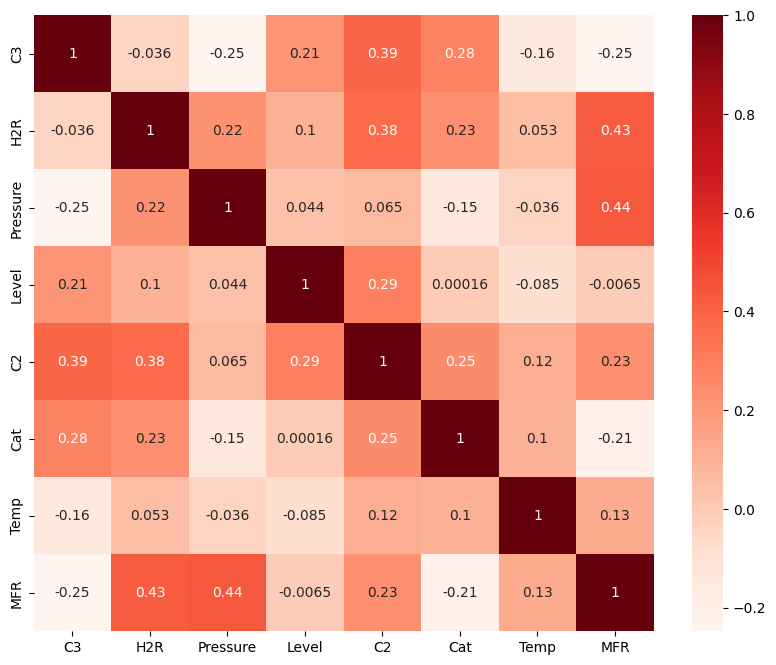

In [161]:
plt.figure(figsize=(10,8))
cor = data.corr()
sns.heatmap(cor, annot=True,cmap=plt.cm.Reds)
plt.show()

## **Question 2** **(20 points)**

**Part 1 (5 points)**
What does correlation mean?

__Answer__: Correlation is a type of statistic measurement that tells us how two variables change together. It indicates the direction and strength of the linear relationship between the variables under consideration.

When the correlation coefficient is 1, it indicates a positive linear relationship i.e if one variable increases, the other also inreases proportionally. The converse applies for a correlation coefficient of -1, if one variable increases the other decreases proportionally.

A correlation coefficient of 0 indicates no linear relationship between the variables.

**Part 2 (10 points)**
What are your observations? Which variables are strongly correlated with `MFR` and which variables are weakly correlated with `MFR`?

__Answer__: H2R and Pressure are strongly correlated with MFR and C3
C2, Cat, Temp, Level (almost negligible correlation) are weakly correlated with MFR.

**Part 3 (5 points)**
Is a variable with a large *negative* correlation useful or not?

__Answer__: A variable with a large negative correlation is useful as it tell us that there is an inverse relationship between the two variables. This could be useful in making predictions. In some cases, a large negative correlation could indicate predictive power and identifying patterns. For example, if there is a negative correlation between the amount of snow and the number of aircrafts landing at the airport, it suggests that higher the amount of snow, the lesser number of aircrafts can land at the airport.

### Pair Plot

A pair plot shows the correlation between variables.

```python
sns.pairplot(data)
```

It has bar distributions on the diagonal and scatter plots on the off-diagonal. A pair plot also shows a different color (`hue`) by category `w`. Pair plots show correlations between pairs of variables that may be related and gives a good indication of features (explanatory inputs) that are used for classification or regression. Generate your own pair plot of the data.

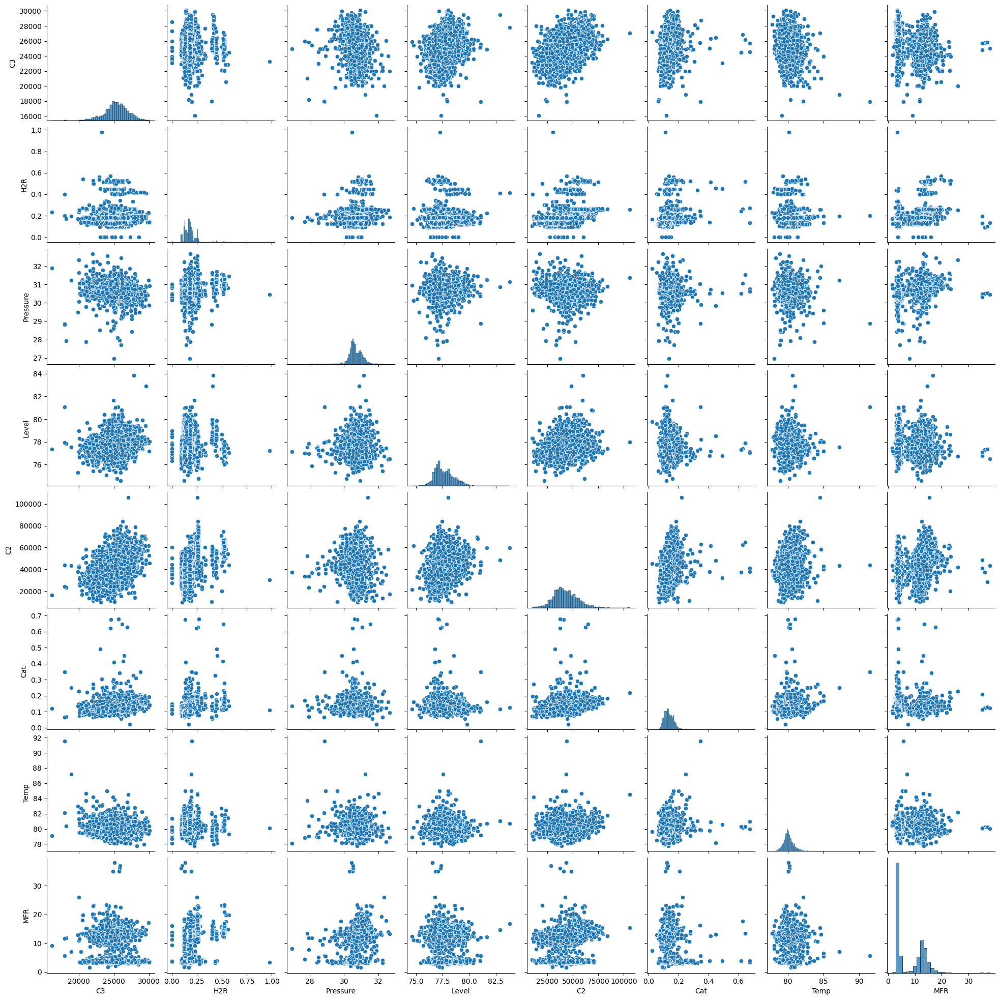

In [162]:
sns.pairplot(data) # This will run for a little bit

### Joint Plot

Want to change the plot style? No problem! 👌

A joint plot shows two variables, with the univariate and joint distributions.

```python
sns.jointplot(x='H2R',y='MFR',data=data,kind="kde")
```

Generate your own joint plot with the data. Try `kind='reg'`, `'kde'`, and `'hex'` to see different joint plot styles.

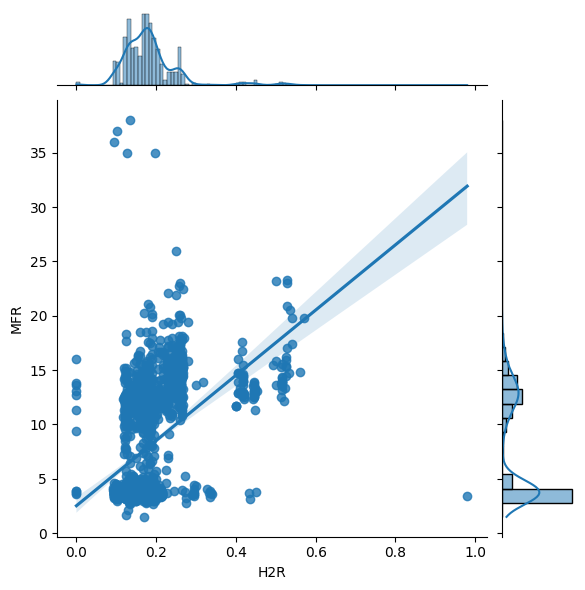

In [163]:
sns.jointplot(x='H2R',y='MFR',data=data,kind="reg")

### Data Analysis with `ydata-profiling` (formerly known as pandas-profiling)

ydata - Profiling is a data analysis tool for a more in-depth summary of the data than the `descibe()` function. [Install the package](https://docs.profiling.ydata.ai/latest/getting-started/installation/) with:

```python
pip install --user ydata-profiling[notebook]
jupyter nbextension enable --py widgetsnbextension
```

<!-- **This idea is important!** You will need to install more packages than Colab provides, and this is an example of doing that.

NOTE:  You need to restart the Kernel before proceeding. The install only needs to run once.  We will talk about this in class. -->

In [164]:
# first need to uninstall a conflicting version of a package,
# then install ydata-profiling
!pip uninstall typing-extensions -y
!pip install -U ydata-profiling[notebook] typing-extensions==4.6.0

# this line allows to use cool interactive widgets with a notebook
# which we will see in action in a few code cells below
!jupyter nbextension enable --py widgetsnbextension


Found existing installation: typing_extensions 4.6.0
Uninstalling typing_extensions-4.6.0:
  Successfully uninstalled typing_extensions-4.6.0
  Using cached ydata_profiling-4.6.4-py2.py3-none-any.whl (357 kB)
  Using cached typing_extensions-4.6.0-py3-none-any.whl (30 kB)
  Using cached pydantic-2.6.0-py3-none-any.whl (394 kB)
  Using cached typeguard-4.1.5-py3-none-any.whl (34 kB)
  Using cached annotated_types-0.6.0-py3-none-any.whl (12 kB)
  Using cached pydantic_core-2.16.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.2 MB)
INFO: pip is looking at multiple versions of pydantic to determine which version is compatible with other requirements. This could take a while.
  Using cached pydantic-2.5.3-py3-none-any.whl (381 kB)
  Using cached pydantic_core-2.14.6-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.1 MB)
  Using cached pydantic-2.5.2-py3-none-any.whl (381 kB)
  Using cached pydantic_core-2.14.5-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_

In [165]:
from ydata_profiling import ProfileReport

"Time" breaks the profiling. Remove this column from the data before generating your profile report.

In [166]:
data = data.drop(['Time'], axis=1)

In [167]:
# here we generate the big report
profile = ProfileReport(data, minimal=False)

ProfileReport takes a little time to render the results, please be patient. Next, we can view the report interactively with `profile.to_widgets()`

IMPORTANT NOTE: If you run the following cell and nothing appears, or you get some sort of warning message, try re-running the `profile = ProfileReport(data, minimal=False)` cell again, and then re-run `profile_to_widgets()` cell. The ProfileReport can be a little finicky with Colab.

In [168]:
# This will make nice interface in the notebook
profile.to_widgets()

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:507: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

View the profile report in the Jupyter Notebook with `profile.to_widgets()`.

## **Question 3** **(10 points)**

Notice that the output of the previous cell is a collection of interactive tabs that contain useful information about our data. Expore the tabs to get familiar with why type of information is present.

Next, find the two most "relevant" variables to `MFR` and fit them with linear regression. Cut and paste their "Interaction" plots here.  Why do you think they are relevant?

Compare the results (r^2 and mse) using these variables with your previous experiments.

__Answer__: H2R and Pressure are the 2 most relevant variables to 'MFR' since they have a linearly increasing relationship to MFR based on observing the interaction plot.


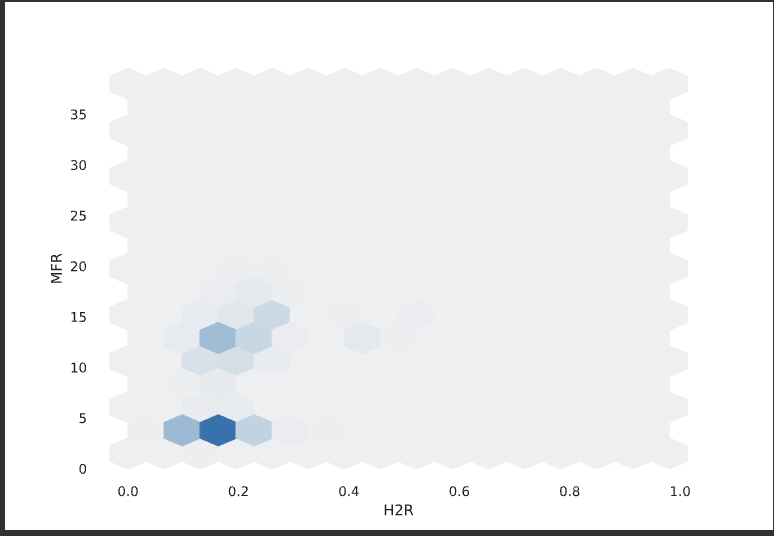

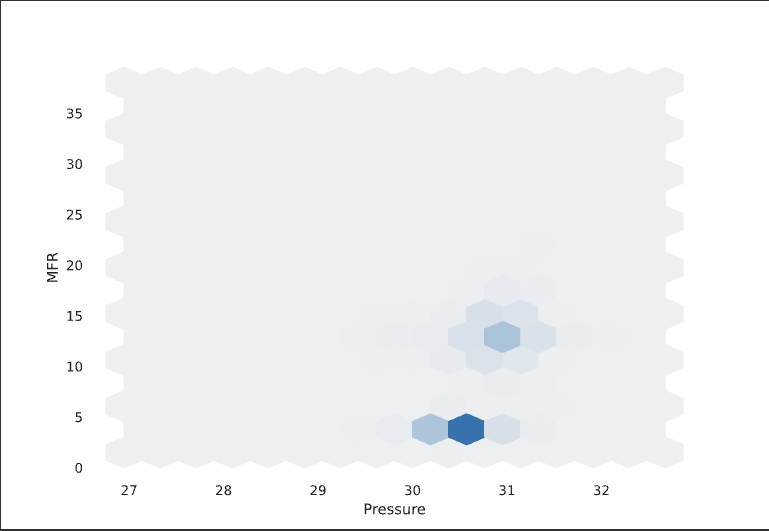

In [169]:
model = method.fit(
    X=train_dropna[['H2R']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

r2 = method.score(test_dropna[['H2R']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['H2R']].to_numpy()), test_dropna['MFR'].to_numpy())

print('Using H2R feature to predict MFR.')
print('R^2: ' + str(r2))
print('mse: ' + str(mse))
print("\n")


model = method.fit(
    X=train_dropna[['Pressure']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

r2 = method.score(test_dropna[['Pressure']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['Pressure']].to_numpy()), test_dropna['MFR'].to_numpy())

print('Using Pressure feature to predict MFR.')
print('R^2: ' + str(r2))
print('mse: ' + str(mse))
print("\n")

Using H2R feature to predict MFR.
R^2: 0.1856638538044687
mse: 21.19870895763556


Using Pressure feature to predict MFR.
R^2: 0.2019090680741491
mse: 20.775815327202643




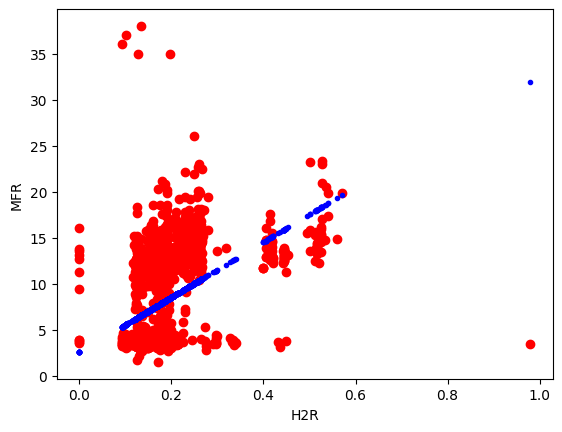

In [170]:
# Your code here
# Your code here
# Your code here
# Your code here
# Your code here

import numpy as np
import matplotlib.pyplot as plt

x1 = data['H2R'].values
y1 = data['MFR'].values

p1 = np.polyfit(x1,y1,1)

plt.plot(x1,y1,'ro',label='Measured (z)')
plt.plot(x1,np.polyval(p1,x1),'b.',label='predicted (y)')
plt.xlabel("H2R")
plt.ylabel("MFR")

plt.show()

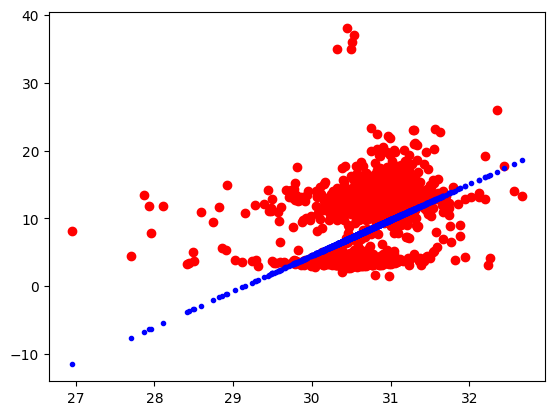

In [171]:
x2 = data['Pressure'].values
y2 = data['MFR'].values

p2 = np.polyfit(x2,y2,1)

plt.plot(x2,y2,'ro',label='Measured (z)')
plt.plot(x2,np.polyval(p2,x2),'b.',label='predicted (y)')

plt.show()

Tired of manually selecting variables? We can use the model to select best features (variables) automatically.

### Select Best Features

We can rank the features to determine the best set that predicts `MFR`.

```python
from sklearn.feature_selection import SelectKBest, f_regression
best = SelectKBest(score_func=f_regression, k='all')
fit = best.fit(x,z)
plt.bar(x=x.columns,height=fit.scores_)
```

There is additional information on [Select K Best Features](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectKBest.html).

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


<BarContainer object of 7 artists>

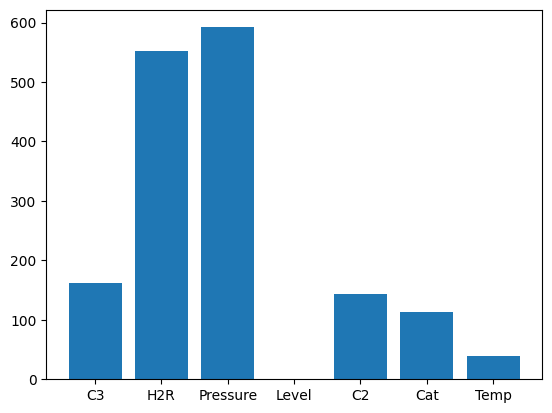

In [172]:
x=data[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']]
z=data[['MFR']]

# These are various feature selection algorithms available
from sklearn.feature_selection import SelectKBest, f_regression
import matplotlib.pylab as plt

# First, instantiate the selection algorithm with the scoring criteria
# here is the documentation on the scoring criteria we selected:
# https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.f_regression.html#sklearn.feature_selection.f_regression
best = SelectKBest(score_func=f_regression, k='all')

# fit the selection algorithm on our data and return
# the f-statistic for each variable; the higher the score,
# the more "significant" the variable is
fit = best.fit(x,z)
plt.bar(x=x.columns,height=fit.scores_)

## **Question 4** **(10 points)**

Based on the above results, select the variables you think are related to `MFR` and fit them with linear regression. Compare the results with the previous experiments.  What do observe?

__Answer__: Based on the above results, H2R and Pressure are related to MFR.


In [173]:
# Your code here
# Your code here
# Your code here
# Your code here
# Your code here
# Almost same question as above
model = method.fit(
    X=train_dropna[['H2R']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

r2 = method.score(test_dropna[['H2R']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['H2R']].to_numpy()), test_dropna['MFR'].to_numpy())

print('Using H2R feature to predict MFR.')
print('R^2: ' + str(r2))
print('mse: ' + str(mse))
print("\n")


model = method.fit(
    X=train_dropna[['Pressure']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

r2 = method.score(test_dropna[['Pressure']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['Pressure']].to_numpy()), test_dropna['MFR'].to_numpy())

print('Using Pressure feature to predict MFR.')
print('R^2: ' + str(r2))
print('mse: ' + str(mse))
print("\n")

Using H2R feature to predict MFR.
R^2: 0.1856638538044687
mse: 21.19870895763556


Using Pressure feature to predict MFR.
R^2: 0.2019090680741491
mse: 20.775815327202643




# Solution with Feature Engineering + Data processing

The result of the model is not good enough? Still want to improve the performance further?

Randy 🧙 has a few questions for you. Are there any outliers in the data? Do all variables satisfy the assumptions of the linear model?


There are several graphical techniques to help detect outliers. A box or histogram plot shows outlying points. Make one now and examine it for outliers in each variable.

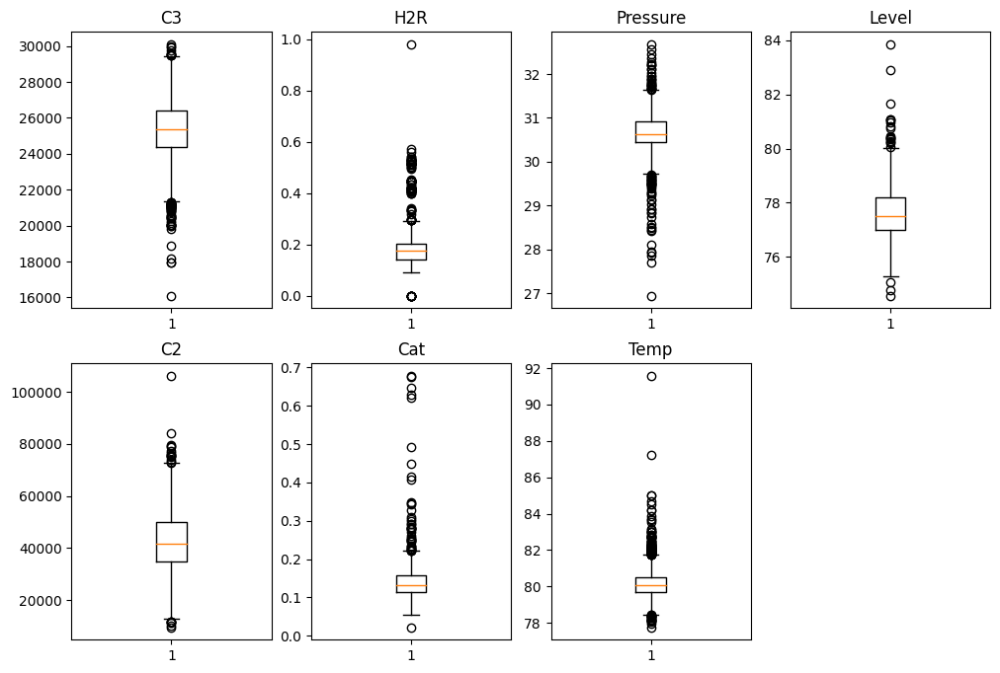

In [174]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))

# iterate over all of the columns
for i,c in enumerate(data.columns):
    if c != "MFR":
        plt.subplot(2,4,i+1)
        plt.title(c)
        plt.boxplot(data[c])
plt.show()

Remove outliers by removing select rows such as with:

```python
data = data[data['H2R']<0.7]
data = data[data['H2R']>0.01]
```

to keep only values of `H2R` (Hydrogen to Monomer ratio) that are between 0.01 and 0.7.

In [175]:
data = data[data['H2R']<0.7]
data = data[data['H2R']>0.01]

Show the boxplot again to verify that the data set does not have the outliers you removed.

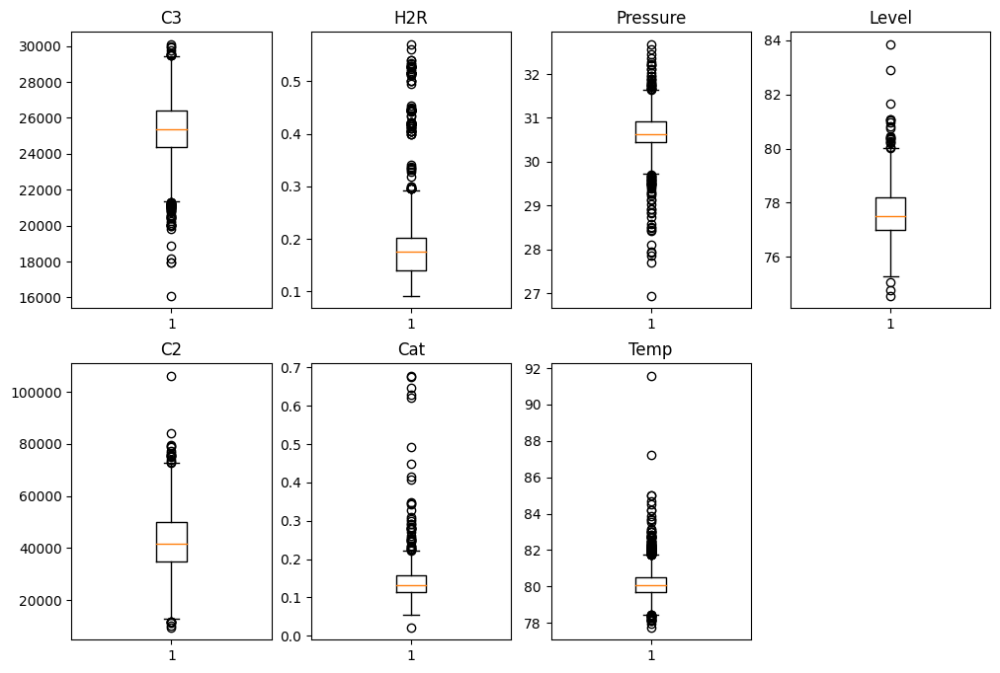

In [176]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))

# iterate over all of the columns
for i,c in enumerate(data.columns):
    if c != "MFR":
        plt.subplot(2,4,i+1)
        plt.title(c)
        plt.boxplot(data[c])
plt.show()

## **Question 5** **(10 points)**

Are there any other outliers in other variables? If so, please remove them.  How did you go about defining outliers?

__Answer__: Yes, there are outliers in other variables. The code snippet to remove them is given below. From the box plots visualization, I was able to identify the data points which were beyond the whiskers of the box plot i.e outliers and wrote code to remove them as shown below.


In [177]:
# Provide any code for Question 5 here
data = data[data['C2']<100000]
data = data[data['MFR']<30]
data = data[data['Temp']<86]
data.head()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR
0,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,3.4
1,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,3.2
2,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,3.2
3,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,3.1
4,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,3.3


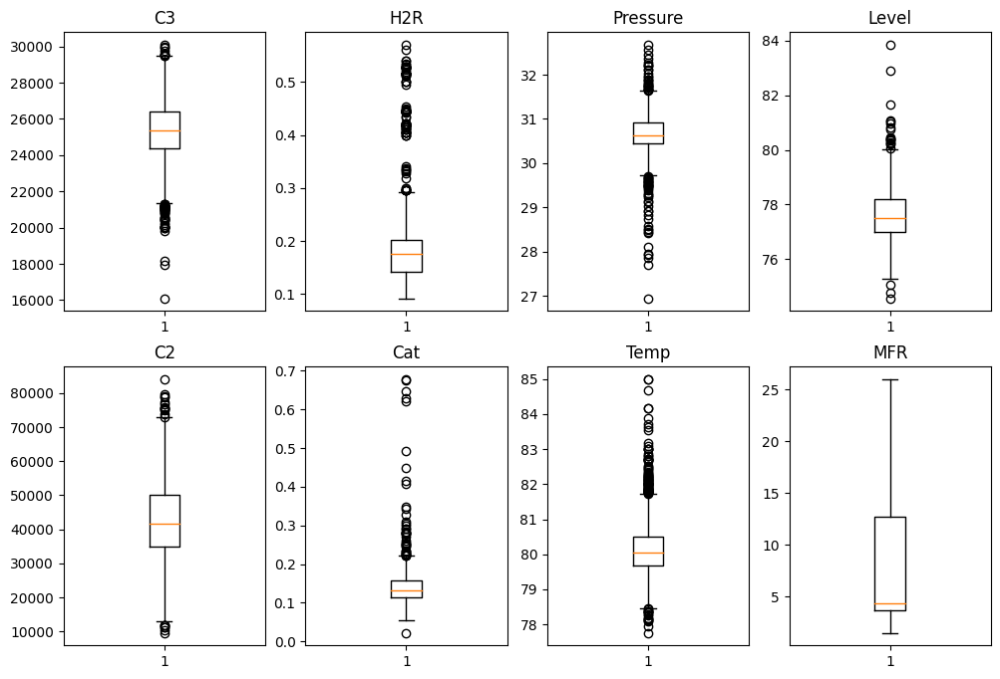

In [178]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))

# iterate over all of the columns
for i,c in enumerate(data.columns):
    if i <= 7:
        plt.subplot(2,4,i+1)
        plt.title(c)
        plt.boxplot(data[c])
plt.show()

# Important question!

Who controls the features that you process?  Are you stuck with the features provided by the original experiment?

**NO!!!!**

You have the power!  For example, any invertible transformation of the data can lead to new features or even new targets!   Actually any transformation whatsoever can lead to new features and targets.  Invertible just means that you can always recover your original data :-)

For example, we can apply log transformation to `MFR` and try and predict that instead.  Since the log is invertible, we can just predict that, get an prediction, and then apply the inverse of the log (the exponential map).

Create a new column for the natural log of (`MFR`) as `lnMFR`.

In [179]:
import numpy as np
data['lnMFR'] = np.log(data['MFR'])

Check the results after log transformation

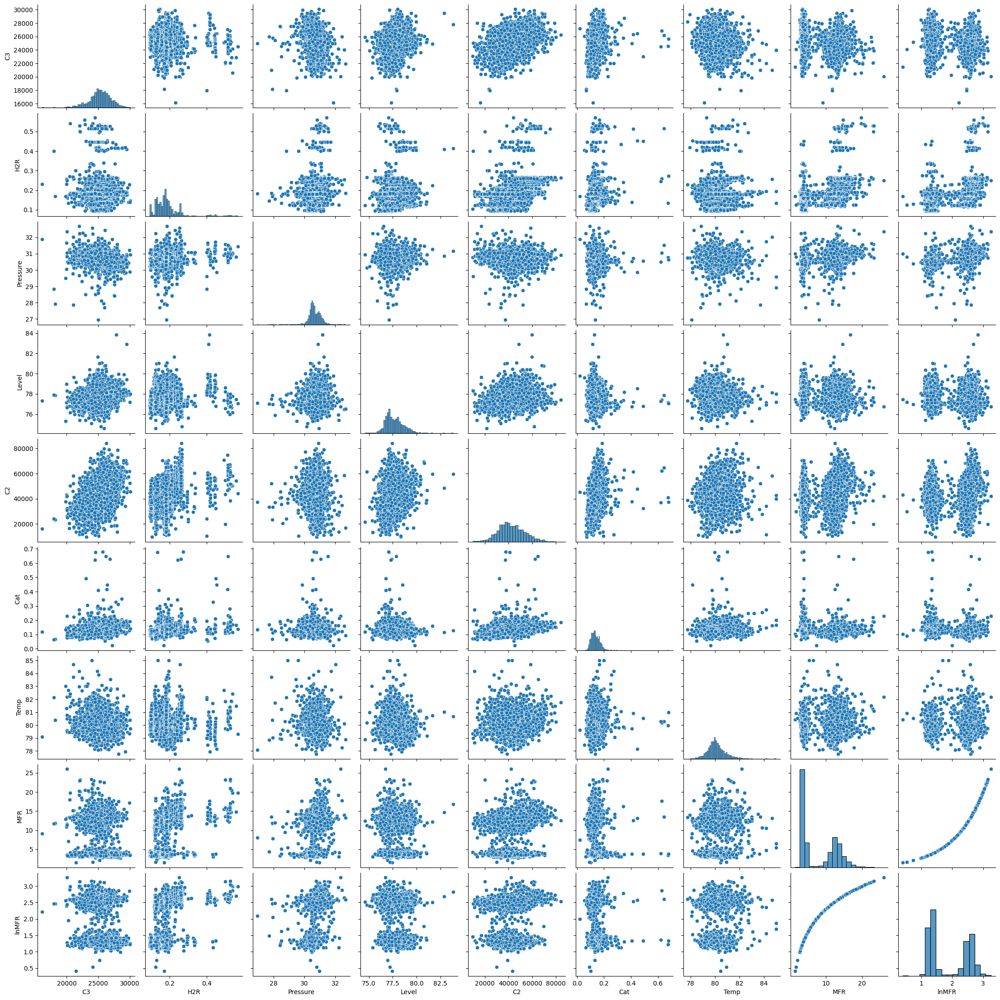

In [180]:
sns.pairplot(data)

## **Question 6** (10 points)

Pick one or two different functions and apply the to `MFR` and see if a transformed `MFR` is easier to predict.  Does transforming `MFR` change what inputs give good predictions?

__Answer__: EXPLAIN YOUR OBSERVATIONS HERE


In [181]:
# Your code here
import numpy as np
from scipy.stats import boxcox

data['boxcoxMFR'], _ = boxcox(data['MFR'])
data['sqrtMFR'] = np.sqrt(data['MFR'])
# data['invMFR'] = 1 / data['MFR']
#data['expMFR'] = np.exp(data['MFR'])
# data['sigmoidMFR'] = 1 / (1 + np.exp(-data['MFR']))

In [182]:
data.columns
data.head()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR,boxcoxMFR,sqrtMFR
0,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,3.4,1.223775,0.938847,1.843909
1,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,3.2,1.163151,0.903587,1.788854
2,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,3.2,1.163151,0.903587,1.788854
3,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,3.1,1.131402,0.884731,1.760682
4,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,3.3,1.193922,0.921605,1.816590


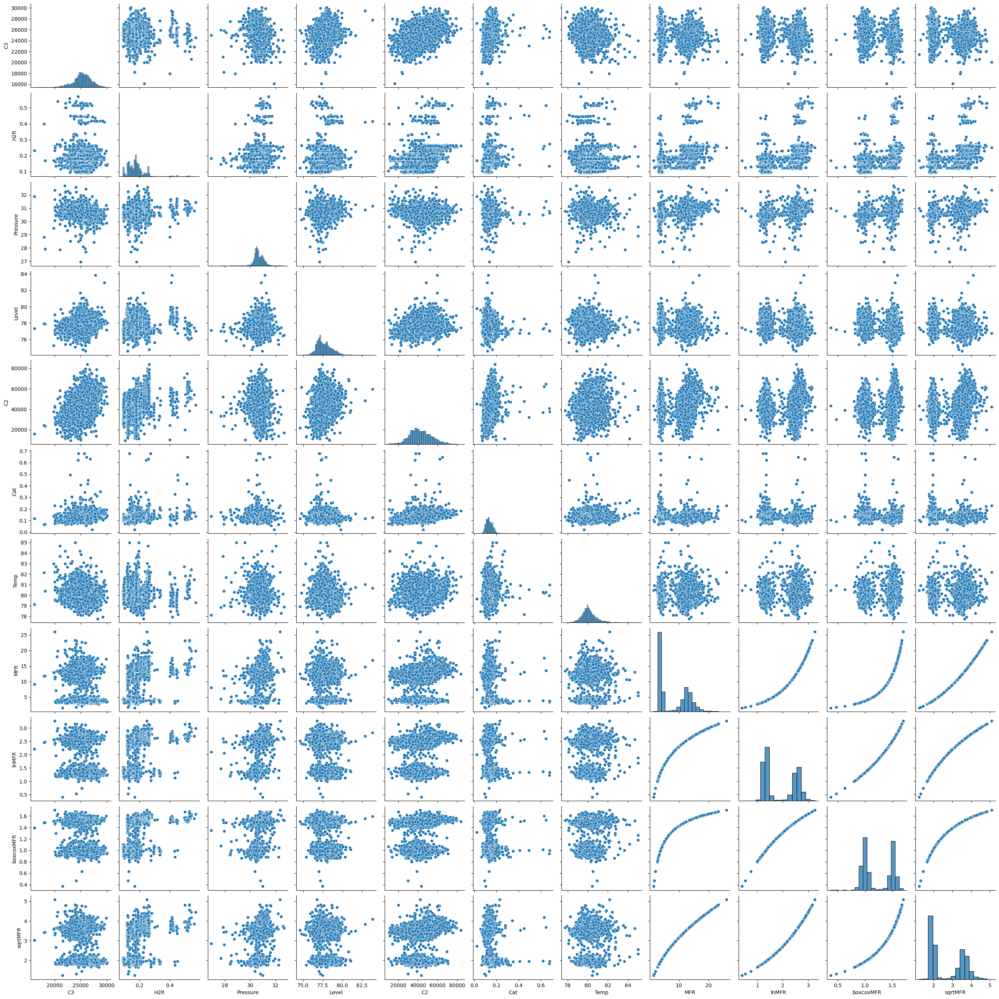

In [183]:
sns.pairplot(data)

In [184]:
# note how we set the random_state
train,test = train_test_split(data, test_size=0.2, shuffle=True, random_state=1)

In [185]:
from sklearn import linear_model
method = linear_model.LinearRegression()

In [186]:
train_dropna = train.dropna()
test_dropna = test.dropna()

In [187]:
model = method.fit(
    X=train_dropna[['H2R']].to_numpy(),
    y=train_dropna['sqrtMFR'].to_numpy())

r2 = method.score(test_dropna[['H2R']].to_numpy(),test_dropna['sqrtMFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['H2R']].to_numpy()), test_dropna['sqrtMFR'].to_numpy())

print('Using H2R feature to predict MFR.')
print('R^2: ' + str(r2))
print('mse: ' + str(mse))
print("\n")

model = method.fit(
    X=train_dropna[['Pressure']].to_numpy(),
    y=train_dropna['sqrtMFR'].to_numpy())

r2 = method.score(test_dropna[['Pressure']].to_numpy(),test_dropna['sqrtMFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['Pressure']].to_numpy()), test_dropna['sqrtMFR'].to_numpy())

print('Using Pressure feature to predict MFR.')
print('R^2: ' + str(r2))
print('mse: ' + str(mse))
print("\n")

Using H2R feature to predict MFR.
R^2: 0.23202769951525493
mse: 0.5904654396245732


Using Pressure feature to predict MFR.
R^2: 0.2162803020818589
mse: 0.6025730298886803




In [188]:
model = method.fit(
    X=train_dropna[['H2R']].to_numpy(),
    y=train_dropna['boxcoxMFR'].to_numpy())

r2 = method.score(test_dropna[['H2R']].to_numpy(),test_dropna['boxcoxMFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['H2R']].to_numpy()), test_dropna['boxcoxMFR'].to_numpy())

print('Using H2R feature to predict MFR.')
print('R^2: ' + str(r2))
print('mse: ' + str(mse))
print("\n")


model = method.fit(
    X=train_dropna[['Pressure']].to_numpy(),
    y=train_dropna['boxcoxMFR'].to_numpy())

r2 = method.score(test_dropna[['Pressure']].to_numpy(),test_dropna['boxcoxMFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['Pressure']].to_numpy()), test_dropna['boxcoxMFR'].to_numpy())

print('Using Pressure feature to predict MFR.')
print('R^2: ' + str(r2))
print('mse: ' + str(mse))
print("\n")

Using H2R feature to predict MFR.
R^2: 0.19935494018681832
mse: 0.056195103739688966


Using Pressure feature to predict MFR.
R^2: 0.20535781170324074
mse: 0.05577377848017872




## **Question 7** (10 points)

Just like using transformations on the target (`MFR` in this case), you can use transformations on the inputs. Can you predict a transformed `MFR` from a set of transformed inputs?

Ok, things start to explode now with so many combinations. Just try a few :-)

__Answer__: EXPLAIN YOUR OBSERVATIONS HERE


In [189]:
# Your code here
# Your code here
# Your code here
# Your code here
# Your code here
data['log_H2R'] = np.log(data['H2R'])

In [190]:
data.replace([np.inf, -np.inf], np.nan, inplace=True)

In [191]:
train,test = train_test_split(data, test_size=0.2, shuffle=True, random_state=1)

In [192]:
from sklearn import linear_model
method = linear_model.LinearRegression()

In [193]:
train_dropna = train.dropna()
test_dropna = test.dropna()

In [194]:
# Fit the model using transformed input and target variables
model.fit(X=train_dropna[['log_H2R']].to_numpy(), y=train_dropna['sqrtMFR'].to_numpy())

# Predict transformed MFR
predicted_sqrtMFR = model.predict(test_dropna[['log_H2R']].to_numpy())

# Calculate performance metrics
r2 = model.score(test_dropna[['log_H2R']].to_numpy(), test_dropna['sqrtMFR'].to_numpy())
mse = mean_squared_error(predicted_sqrtMFR, test_dropna['sqrtMFR'].to_numpy())

print('Using transformed H2R feature to predict transformed MFR.')
print('R^2: ' + str(r2))
print('MSE: ' + str(mse))

Using transformed H2R feature to predict transformed MFR.
R^2: 0.2546817946374511
MSE: 0.5730475454802386


### One important transformation:  Scaling the data

Scale data with the `StandardScalar` from `scikit-learn`. This has the effect of making each column have zero mean and have unit variance.

```python
from sklearn.preprocessing import StandardScaler
s = StandardScaler()
ds = s.fit_transform(data)
```

In [196]:
from sklearn.preprocessing import StandardScaler
# like most methods in sklearn, we first instantiate the algorithm
s = StandardScaler()

# then can use a shortcut function to fit and transform the data of interest
ds = s.fit_transform(data)

The value `ds` is returned as a `numpy` array so we need to convert it back to a `pandas` `DataFrame`.

```python
ds = pd.DataFrame(ds,columns=data.columns)
```

Re-use the column names from `data`.

In [197]:
ds = pd.DataFrame(ds,columns=data.columns)

Now, we can check the results before/after scaling.

In [198]:
data.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR,boxcoxMFR,sqrtMFR,log_H2R
count,2464.000000,2464.000000,2464.000000,2464.000000,2464.000000,2464.000000,2464.000000,2464.000000,2464.000000,2464.000000,2464.000000,2464.000000
mean,25310.898647,0.184288,30.664149,77.651628,42520.869335,0.138475,80.136482,7.972971,1.877334,1.225202,2.689094,-1.745458
std,1697.309321,0.069494,0.422482,0.918323,11281.851495,0.041675,0.773391,4.921827,0.632102,0.264533,0.861421,0.314811
min,16106.025000,0.092000,26.946344,74.575958,9610.464800,0.022162,77.760117,1.500000,0.405465,0.370324,1.224745,-2.385967
25%,24362.821500,0.141000,30.446129,76.993517,34794.638500,0.113795,79.677381,3.700000,1.308333,0.986432,1.923538,-1.958995
50%,25366.086500,0.175000,30.622836,77.503167,41570.359500,0.133056,80.043853,4.300000,1.458615,1.066624,2.073644,-1.742969
75%,26399.124250,0.202000,30.925738,78.212050,50043.432000,0.157162,80.496296,12.700000,2.541602,1.507700,3.563706,-1.599488
max,30083.688000,0.570000,32.674332,83.841675,84018.063000,0.677979,84.992203,26.000000,3.258097,1.700538,5.099020,-0.562119


In [199]:
ds.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR,boxcoxMFR,sqrtMFR,log_H2R
count,2.464000e+03,2.464000e+03,2.464000e+03,2.464000e+03,2464.000000,2.464000e+03,2.464000e+03,2.464000e+03,2.464000e+03,2.464000e+03,2.464000e+03,2.464000e+03
mean,-1.015061e-15,9.227828e-17,-4.602379e-15,5.075305e-15,0.000000,-6.459479e-16,-3.379692e-15,-9.227828e-17,-3.114392e-16,-2.768348e-16,2.422305e-16,-2.768348e-16
std,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00
min,-5.424316e+00,-1.328275e+00,-8.801695e+00,-3.349906e+00,-2.917702,-2.791525e+00,-3.073279e+00,-1.315423e+00,-2.329004e+00,-3.232311e+00,-1.700268e+00,-2.034999e+00
25%,-5.586899e-01,-6.230329e-01,-5.161518e-01,-7.167902e-01,-0.684976,-5.923182e-01,-5.937413e-01,-8.683439e-01,-9.003557e-01,-9.027935e-01,-8.888929e-01,-6.784431e-01
50%,3.252151e-02,-1.336815e-01,-9.780673e-02,-1.616985e-01,-0.084268,-1.300635e-01,-1.197941e-01,-7.464132e-01,-6.625575e-01,-5.995860e-01,-7.146039e-01,7.906008e-03
75%,6.412776e-01,2.549213e-01,6.192967e-01,6.103906e-01,0.666920,4.485000e-01,4.653354e-01,9.606167e-01,1.051101e+00,1.068128e+00,1.015519e+00,4.637703e-01
max,2.812545e+00,5.551432e+00,4.758995e+00,6.741970e+00,3.678972,1.294816e+01,6.279752e+00,3.663414e+00,2.184842e+00,1.797254e+00,2.798185e+00,3.759655e+00


Note how the mean of each column is practically equal to 0, and the standard deviation is practically equal to 1.



Next, we resplit the processed dataset into training and test set.

**Set a same random_state=1 to ensure the splitting of data in this step is the same as the splitting of data in the step earlier in the notebook.**

NOTE:  We will come back to this important point later 🧙

In [200]:
from sklearn.model_selection import train_test_split
train_processed,test_processed = train_test_split(ds, test_size=0.2, shuffle=True, random_state=1)

In [201]:
train_processed = train_processed.dropna()
test_processed = test_processed.dropna()

## **Question 8** (10 points)

Using the trained data to train the linear regression model, and report the results. Do models perform better? Why?

__Answer__: PROVIDE YOUR OBSERVATIONS OF RESULTS HERE

Hint:
```python
method = linear_model.LinearRegression()

model = method.fit(train_processed[['variable 1','variable 2']].to_numpy(),train_processed['MFR'].to_numpy())

r2 = method.score(test_processed[['variable 1','variable 2']].to_numpy(),test_processed['MFR'].to_numpy())

mse = mean_squared_error(method.predict(test_processed[['variable 1','variable 2']].to_numpy()), test_processed['MFR'].to_numpy())

print('R^2: ' + str(r2))

print('mse: ' + str(mse))
```

In [202]:
# Your code here
method = linear_model.LinearRegression()

model = method.fit(train_processed[['H2R','Pressure']].to_numpy(),train_processed['MFR'].to_numpy())

r2 = method.score(test_processed[['H2R','Pressure']].to_numpy(),test_processed['MFR'].to_numpy())

mse = mean_squared_error(method.predict(test_processed[['H2R','Pressure']].to_numpy()), test_processed['MFR'].to_numpy())

print('R^2: ' + str(r2))

print('mse: ' + str(mse))


R^2: 0.3752125125722803
mse: 0.6631721069442396


# More advanced solution

Want to learn more? Let's look at a more advanced solution.

![?](https://i.imgflip.com/2l2aus.jpg)

Let's try a count plot to show the number of binned samples of `lnMFR`.

<Axes: xlabel='lnMFR', ylabel='count'>

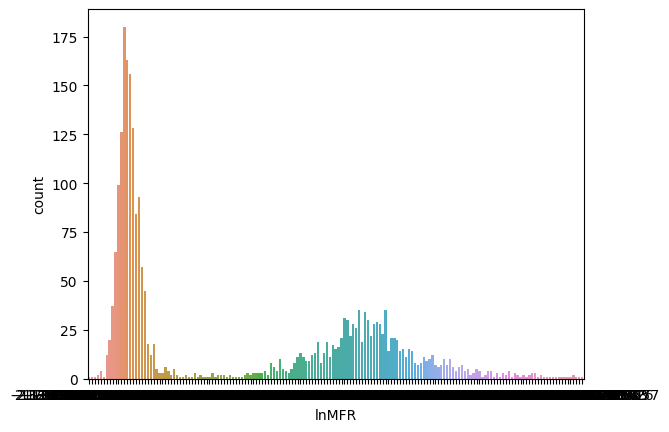

In [203]:
sns.countplot(x=ds['lnMFR'])

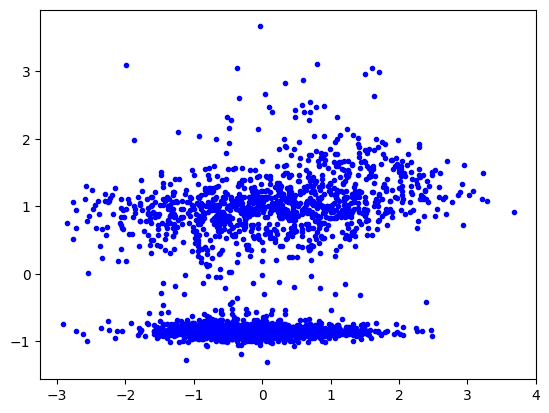

In [204]:
plt.plot(ds['C2'], ds['MFR'],'b.')

Note the interesting distribution of the data- it has a multimodal Gaussian distribution, in this case with two peaks.

Why not split the data into two parts, one for each Gaussian, then perform regression on each part separately? Will this regression perform better than a single regression algorithm for the full dataset?

First we split the data into two parts, then make train/test splits of each part with

In [205]:
from sklearn.model_selection import train_test_split
lower_data = ds[ds['lnMFR']<0]
upper_data = ds[ds['lnMFR']>0]
lower_train,lower_test = train_test_split(lower_data, test_size=0.2, shuffle=True,random_state=1)
upper_train,upper_test = train_test_split(upper_data, test_size=0.2, shuffle=True,random_state=1)

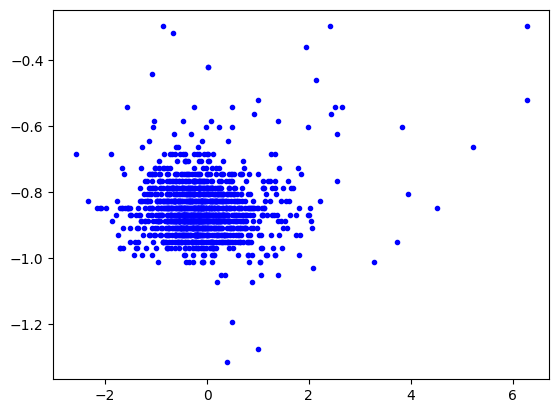

In [206]:
plt.plot(lower_data['Temp'], lower_data['MFR'],'b.')

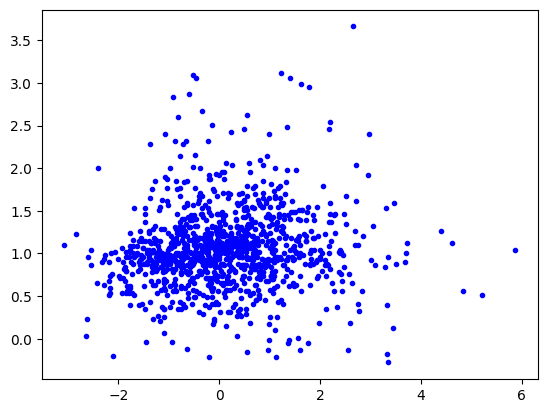

In [207]:
plt.plot(upper_data['Temp'], upper_data['MFR'],'b.')

Run the following code to test linear regression on the full data set as well as the subsets.

In [208]:
def fits(data):
    X = ['Temp']
    y = ['MFR']
    # change this if you applied log transformation to your selected variables.
    method = linear_model.LinearRegression()

    model = method.fit(data[X].to_numpy(), data[y].to_numpy())

    MFR_pred = method.predict(data[X].to_numpy())
    r2_model = method.score(data[X].to_numpy(),data['lnMFR'].to_numpy())
    mse_model = mean_squared_error(method.predict(data[X].to_numpy()), data['lnMFR'].to_numpy())

    print('R^2: ' + str(r2_model))
    print('mse: ' + str(mse_model))

    plt.plot(data[X[0]], data[y],'b.', label="Real Data")
    plt.plot(data[X[0]], MFR_pred,'r.', label="Predictions")
    plt.legend()


    return

R^2: -93.93816659545311
mse: 37.917417726379036


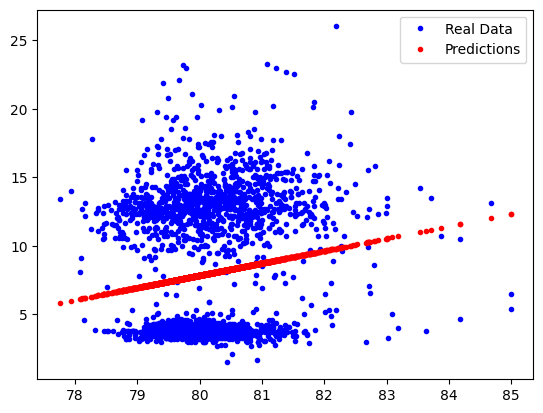

In [209]:
fits(data)

R^2: -0.01621903925645274
mse: 0.031651660808140254


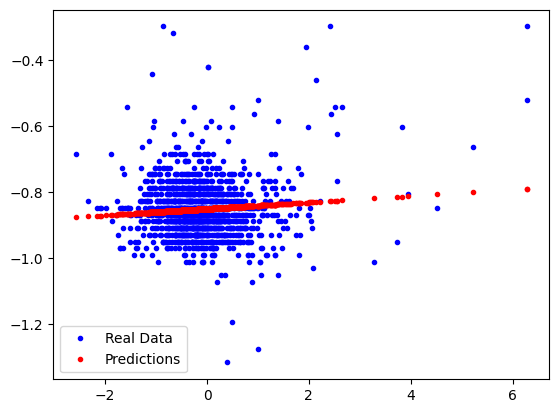

In [210]:
fits(lower_data)

R^2: -0.013051354919947578
mse: 0.0761895694542981


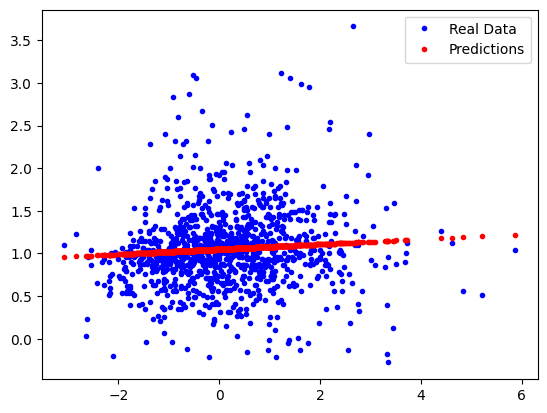

In [211]:
fits(upper_data)

## **Question 9** (10 points)

Explain what is going on here?  Was it ever a good idea to use linear regression on the whole dataset!?  In particular, what does it mean that the R^2 and mse changed so much?

__Answer__: PROVIDE YOUR ANSEWR HERE


## **Question 10** **($\infty$ points, since this is where you really learn stuff! :-)**

You can get as many points of extra credit as you like by doing a good job with this question!

Play around with doing a better analysis.  Things to try:

1.   Redo the calculations, but start from the split dataset above.
2.   Try different train and test splits and see if the answer changes (i.e.,
```
train_processed,test_processed = train_test_split(ds, test_size=0.2, shuffle=True, random_state=1234)
```
3.   Try different methods such as `linear_model.LinearRegression()`, `KNeighborsRegressor(n_neighbors=20)`, `linear_model.Ridge()`, `linear_model.Lasso()`, or `linear_model.BayesianRidge()`. Can you achieve better performance than any of the previous models?

4.  Answer the following question carefully:  What is the problem with using this method of selecting a model based on its performance on testing data?
